## Importing important libraries

In [9]:
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline


## Loading dataset

In [2]:
data= pd.read_csv("/kaggle/input/food-waste/Food Waste data and research - by country.csv")

## Data Understanding

In [3]:
data.head(5)

,Country,combined figures (kg/capita/year),Household estimate (kg/capita/year),Household estimate (tonnes/year),Retail estimate (kg/capita/year),Retail estimate (tonnes/year),Food service estimate (kg/capita/year),Food service estimate (tonnes/year),Confidence in estimate,M49 code,Region,Source
0,Afghanistan,126,82,3109153,16,594982,28,1051783,Very Low Confidence,4,Southern Asia,https://www.unep.org/resources/report/unep-foo...
1,Albania,127,83,238492,16,45058,28,79651,Very Low Confidence,8,Southern Europe,https://www.unep.org/resources/report/unep-foo...
2,Algeria,135,91,3918529,16,673360,28,1190335,Very Low Confidence,12,Northern Africa,https://www.unep.org/resources/report/unep-foo...
3,Andorra,123,84,6497,13,988,26,1971,Low Confidence,20,Southern Europe,https://www.unep.org/resources/report/unep-foo...
4,Angola,144,100,3169523,16,497755,28,879908,Very Low Confidence,24,Sub-Saharan Africa,https://www.unep.org/resources/report/unep-foo...


In [4]:
data.shape

(214, 12)

## Automatically Visualizing dataset

In [5]:
!pip install autoviz

  Obtaining dependency information for autoviz from https://files.pythonhosted.org/packages/f5/d1/2c4638d0af9c56cca0c8789d126f77d5d7735d2a471865e69ac65bfac1d3/autoviz-0.1.732-py3-none-any.whl.metadata
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.5/18.5 MB 39.8 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 27.4 MB/s eta 0:00:0000:0100:01m
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 64.7 MB/s eta 0:00:00:00:01
  Obtaining dependency information for pandas-dq==1.28 from https://files.pythonhosted.org/packages/73/4c/97a4514072a6ff2d2330808942a475053c3cf5954aafc960971110c8c306/pandas_dq-1.28-py3-none-any.whl.metadata
  Obtaining dependency information for pyamg from https://files.pythonhosted.org/packages/98/b4/3a2ad86fa06b157e1aeee7a1d24e214e6374c764886506f6262a9cac8301/pyamg-5.0.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.5/96.5 kB 8.3 MB/s eta 0:00:00
     ━━━

In [6]:
from autoviz.AutoViz_Class import AutoViz_Class
av= AutoViz_Class()

Imported v0.1.731. After importing autoviz, execute '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)


## Parameters of autoviz

* depVar: The name of the target variable.
* verbose: The level of verbosity. If it is 0 or 1, it only shows the plots on the notebook. If we give 2, it also saves the   plots
* dfte: The dataframe containing the dataset
* lowess: A boolean indicating whether to use the LOWESS smoother for scatter plots.
* max_rows_analyzed: The maximum number of rows to be analyzed from the dataset.
* max_cols_analyzed: The maximum number of columns to be analyzed from the dataset.

Shape of your Data Set loaded: (214, 12)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    12 Predictors classified...
        3 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['Country', 'Household estimate (tonnes/year)', 'M49 code']
To fix data quality issues automatically, import FixDQ from autoviz...


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Country,object,0.000000,100,nan,nan,"Possible ID colum: drop before modeling process., 214 rare categories: Too many to list. Group them into a single category or drop the categories., high cardinality with 214 unique values: Use hash encoding or embedding to reduce dimension."
combined figures (kg/capita/year),int64,0.000000,28,61.000000,260.000000,has 9 outliers greater than upper bound (171.88) or lower than lower bound(80.88). Cap them or remove them.
Household estimate (kg/capita/year),int64,0.000000,24,33.000000,189.000000,"has 9 outliers greater than upper bound (126.50) or lower than lower bound(42.50). Cap them or remove them., has a high correlation with ['combined figures (kg/capita/year)']. Consider dropping one of them."
Household estimate (tonnes/year),int64,0.000000,100,850.000000,91646213.000000,"Possible ID colum: drop before modeling process., has 23 outliers greater than upper bound (5175813.00) or lower than lower bound(-2996183.00). Cap them or remove them."
Retail estimate (kg/capita/year),int64,0.000000,7,3.000000,79.000000,has 12 outliers greater than upper bound (20.50) or lower than lower bound(8.50). Cap them or remove them.
Retail estimate (tonnes/year),int64,0.000000,99,138.000000,22424705.000000,"has 23 outliers greater than upper bound (873275.50) or lower than lower bound(-503950.50). Cap them or remove them., has a high correlation with ['Household estimate (tonnes/year)']. Consider dropping one of them."
Food service estimate (kg/capita/year),int64,0.000000,8,3.000000,90.000000,has 18 outliers greater than upper bound (31.00) or lower than lower bound(23.00). Cap them or remove them.
Food service estimate (tonnes/year),int64,0.000000,99,276.000000,65377741.000000,"has 25 outliers greater than upper bound (1543317.50) or lower than lower bound(-890164.50). Cap them or remove them., has a high correlation with ['Household estimate (tonnes/year)', 'Retail estimate (tonnes/year)']. Consider dropping one of them."
Confidence in estimate,object,0.000000,1,nan,nan,No issue
M49 code,int64,0.000000,100,4.000000,894.000000,Possible ID colum: drop before modeling process.


Number of All Scatter Plots = 21


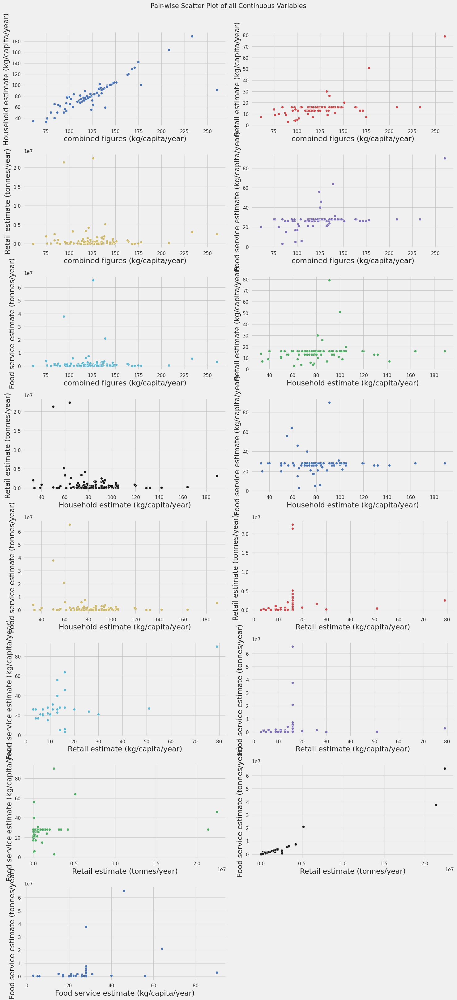

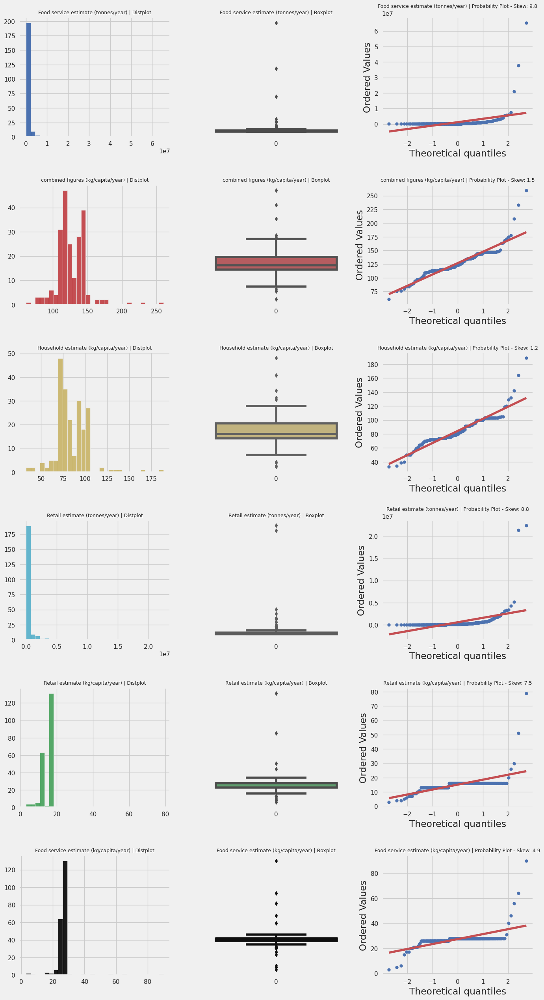

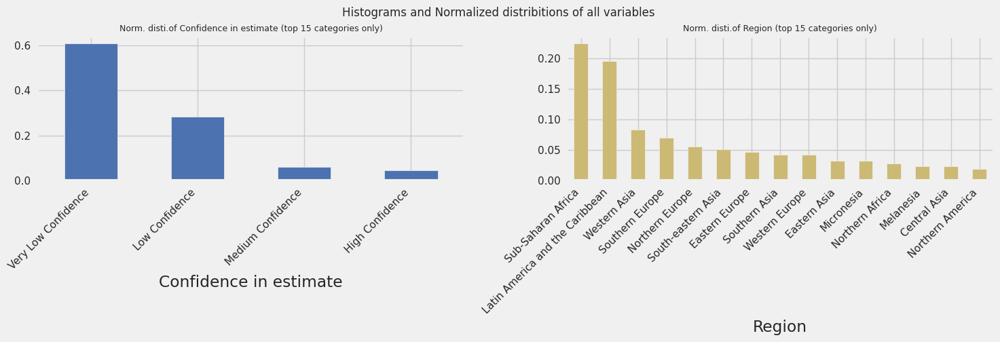

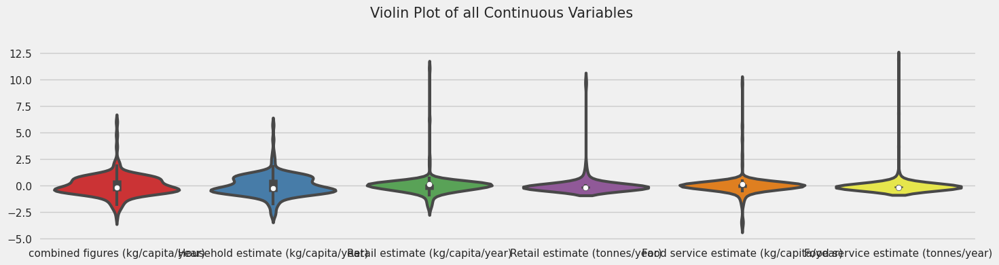

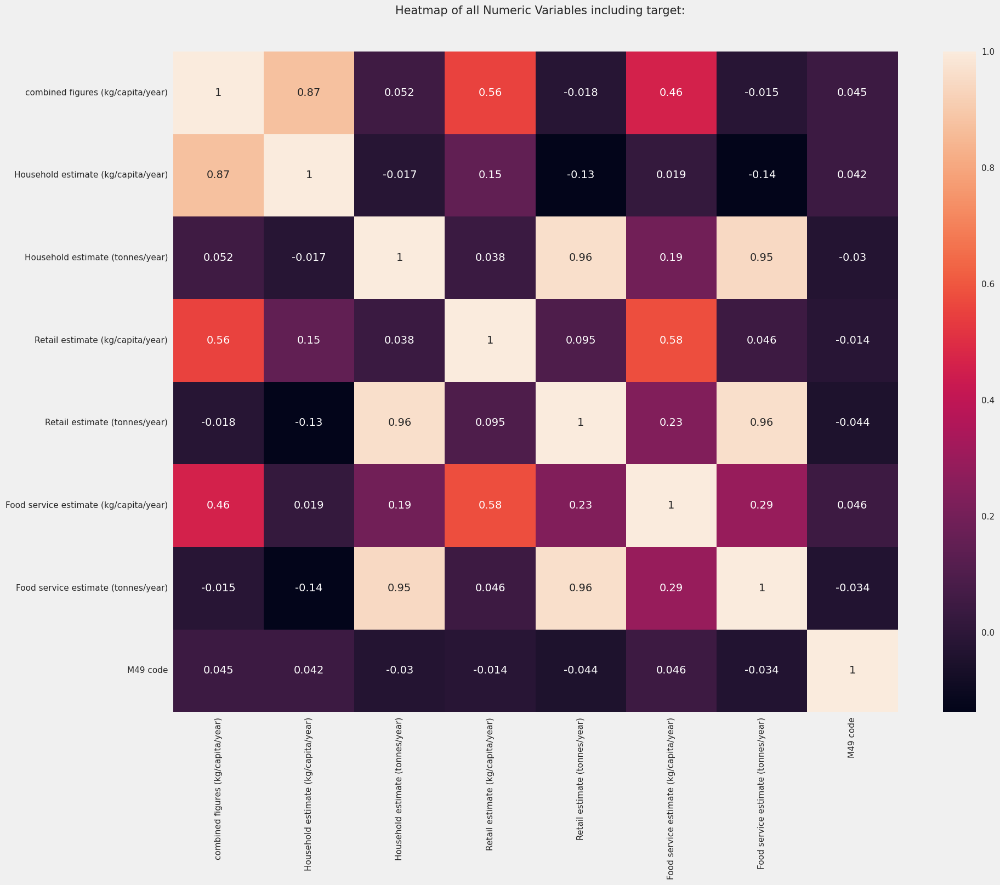

...

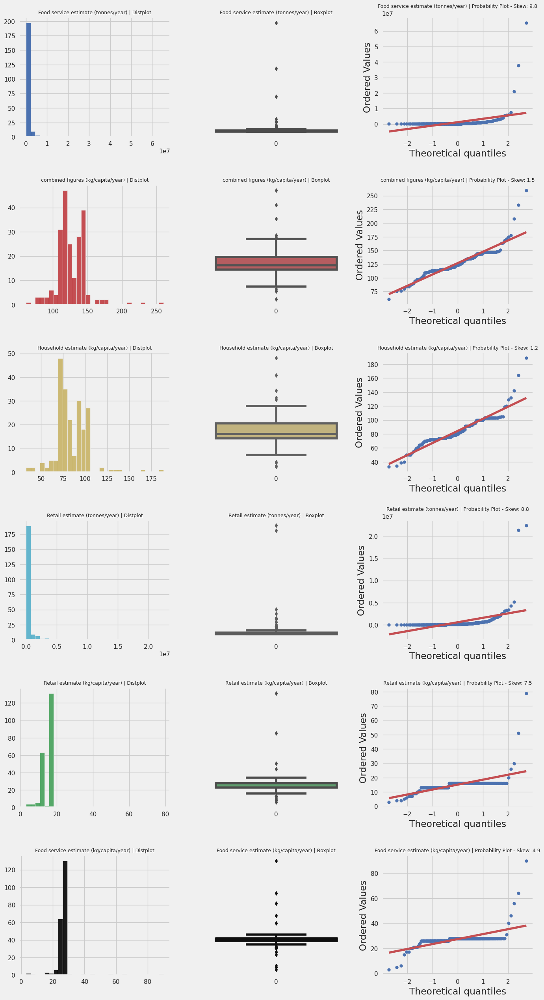

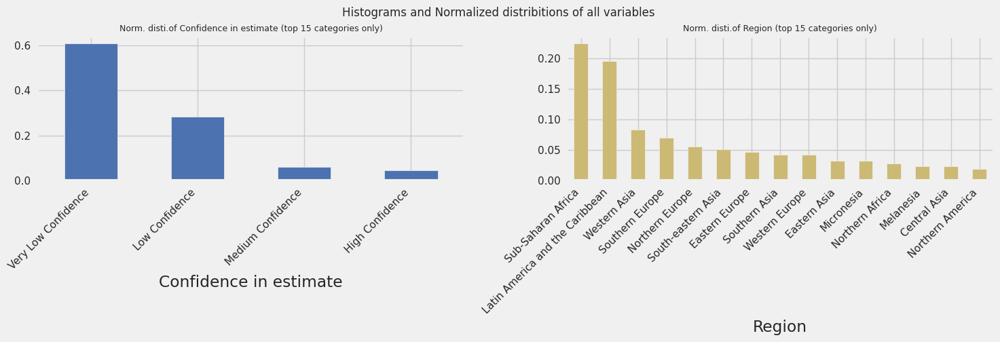

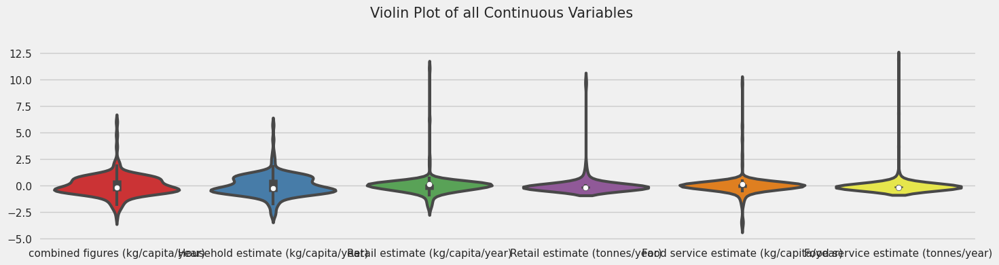

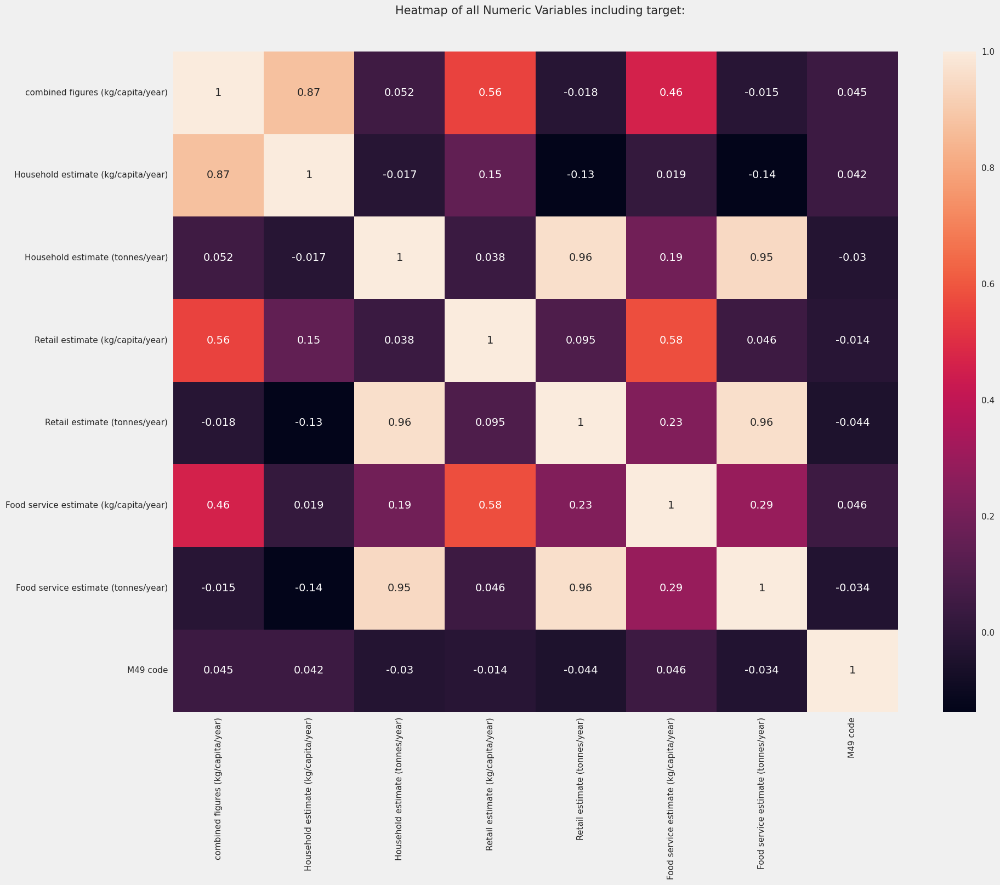

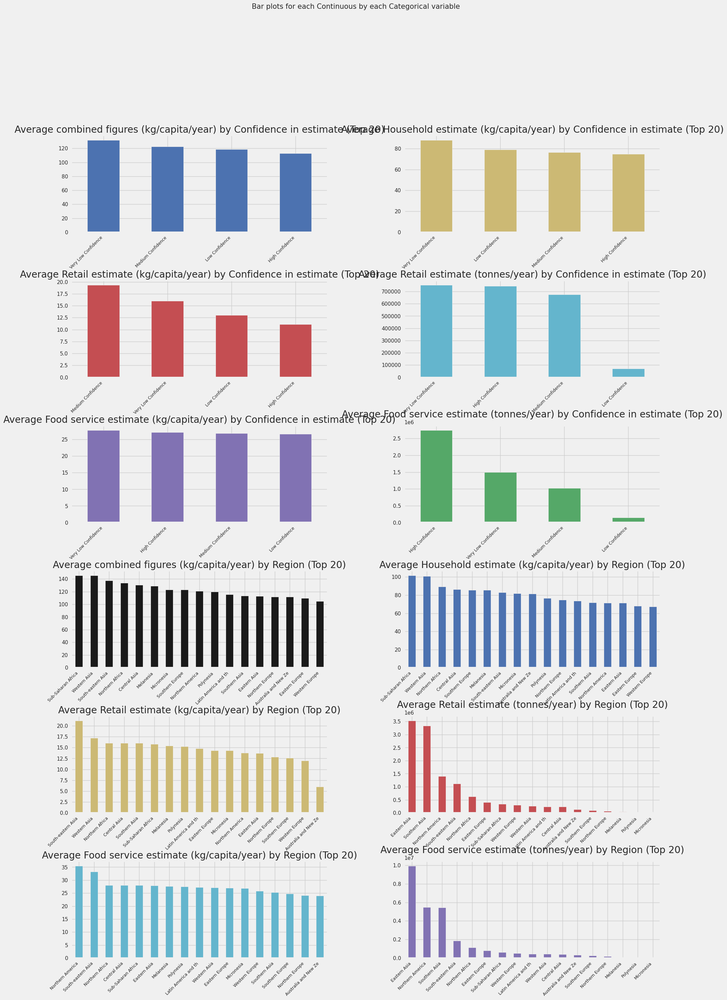

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     /usr/share/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     /usr/share/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to
[nltk_data]    |     /usr/share/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     /usr/share/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     /usr/share/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /usr/share/nltk_data...
[nltk_data]    |   Package movie_reviews is already up-to-date!
[nltk

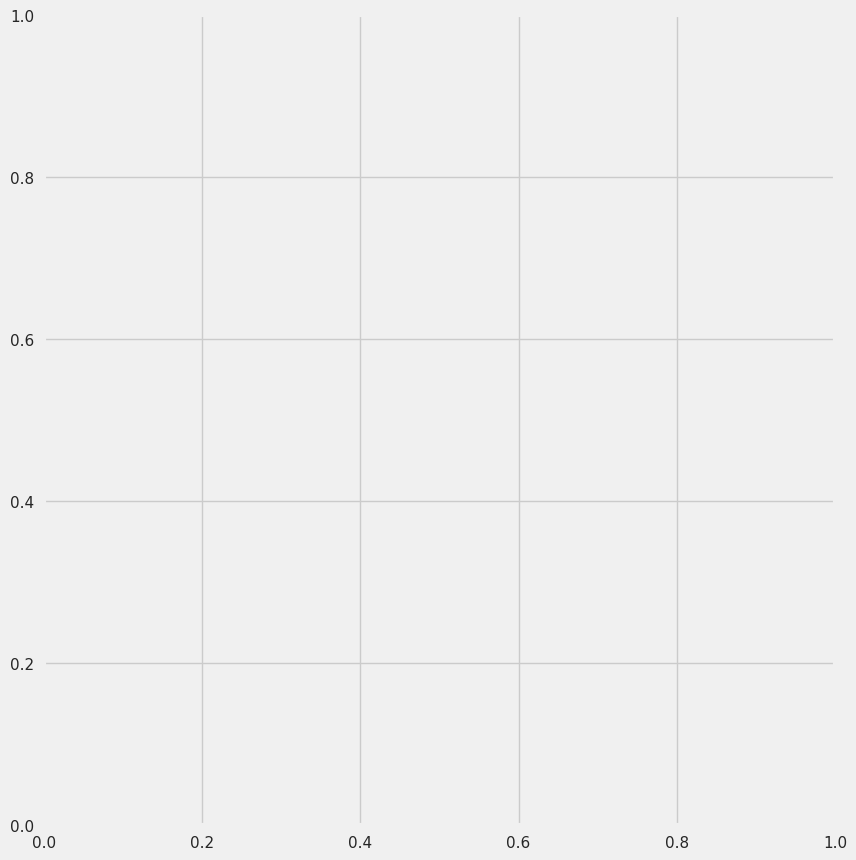

In [10]:
data_av=av.AutoViz("",
    sep=",",
    depVar="", dfte= data, verbose=1)

**AutoViz automatically analyzes the dataset and provides suggestions for how to clean the data set. It detects missing values, identifies rare categories.**

In [8]:
from autoviz import data_cleaning_suggestions
data_cleaning_suggestions(data)

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Country,object,0.000000,100,nan,nan,"Possible ID colum: drop before modeling process., 214 rare categories: Too many to list. Group them into a single category or drop the categories., high cardinality with 214 unique values: Use hash encoding or embedding to reduce dimension."
combined figures (kg/capita/year),int64,0.000000,28,61.000000,260.000000,has 9 outliers greater than upper bound (171.88) or lower than lower bound(80.88). Cap them or remove them.
Household estimate (kg/capita/year),int64,0.000000,24,33.000000,189.000000,"has 9 outliers greater than upper bound (126.50) or lower than lower bound(42.50). Cap them or remove them., has a high correlation with ['combined figures (kg/capita/year)']. Consider dropping one of them."
Household estimate (tonnes/year),int64,0.000000,100,850.000000,91646213.000000,"Possible ID colum: drop before modeling process., has 23 outliers greater than upper bound (5175813.00) or lower than lower bound(-2996183.00). Cap them or remove them."
Retail estimate (kg/capita/year),int64,0.000000,7,3.000000,79.000000,has 12 outliers greater than upper bound (20.50) or lower than lower bound(8.50). Cap them or remove them.
Retail estimate (tonnes/year),int64,0.000000,99,138.000000,22424705.000000,"has 23 outliers greater than upper bound (873275.50) or lower than lower bound(-503950.50). Cap them or remove them., has a high correlation with ['Household estimate (tonnes/year)']. Consider dropping one of them."
Food service estimate (kg/capita/year),int64,0.000000,8,3.000000,90.000000,has 18 outliers greater than upper bound (31.00) or lower than lower bound(23.00). Cap them or remove them.
Food service estimate (tonnes/year),int64,0.000000,99,276.000000,65377741.000000,"has 25 outliers greater than upper bound (1543317.50) or lower than lower bound(-890164.50). Cap them or remove them., has a high correlation with ['Household estimate (tonnes/year)', 'Retail estimate (tonnes/year)']. Consider dropping one of them."
Confidence in estimate,object,0.000000,1,nan,nan,No issue
M49 code,int64,0.000000,100,4.000000,894.000000,Possible ID colum: drop before modeling process.


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Country,object,0.0,100,NaN,NaN,"Possible ID colum: drop before modeling process., 214 rare categories: Too many to list. Group them into a single category or drop the categories., high cardinality with 214 unique values: Use hash encoding or embedding to reduce dimension."
combined figures (kg/capita/year),int64,0.0,28,61.0,260.0,has 9 outliers greater than upper bound (171.88) or lower than lower bound(80.88). Cap them or remove them.
Household estimate (kg/capita/year),int64,0.0,24,33.0,189.0,"has 9 outliers greater than upper bound (126.50) or lower than lower bound(42.50). Cap them or remove them., has a high correlation with ['combined figures (kg/capita/year)']. Consider dropping one of them."
Household estimate (tonnes/year),int64,0.0,100,850.0,91646213.0,"Possible ID colum: drop before modeling process., has 23 outliers greater than upper bound (5175813.00) or lower than lower bound(-2996183.00). Cap them or remove them."
Retail estimate (kg/capita/year),int64,0.0,7,3.0,79.0,has 12 outliers greater than upper bound (20.50) or lower than lower bound(8.50). Cap them or remove them.
Retail estimate (tonnes/year),int64,0.0,99,138.0,22424705.0,"has 23 outliers greater than upper bound (873275.50) or lower than lower bound(-503950.50). Cap them or remove them., has a high correlation with ['Household estimate (tonnes/year)']. Consider dropping one of them."
Food service estimate (kg/capita/year),int64,0.0,8,3.0,90.0,has 18 outliers greater than upper bound (31.00) or lower than lower bound(23.00). Cap them or remove them.
Food service estimate (tonnes/year),int64,0.0,99,276.0,65377741.0,"has 25 outliers greater than upper bound (1543317.50) or lower than lower bound(-890164.50). Cap them or remove them., has a high correlation with ['Household estimate (tonnes/year)', 'Retail estimate (tonnes/year)']. Consider dropping one of them."
Confidence in estimate,object,0.0,1,NaN,NaN,No issue
M49 code,int64,0.0,100,4.0,894.0,Possible ID colum: drop before modeling process.


## Conclusion
**In conclusion, Autoviz is a powerful and user-friendly tool that makes data visualization easy and effortless.**